# Scripts

In [4]:
%run '../shared-code/utils.py'

# Dependencies 

In [5]:
import pandas as pd 
import numpy as np 
import matplotlib.pyplot as plt 
import seaborn as sns 
from sklearn.preprocessing import OrdinalEncoder
import missingno as msno 
import json 
from sklearn.compose import make_column_transformer,make_column_selector
from sklearn.pipeline import make_pipeline,FunctionTransformer
from sklearn.impute import SimpleImputer
import joblib 

%matplotlib inline
sns.set_style("darkgrid", {"axes.facecolor": ".9"})
pd.set_option("display.max_columns",None)

# Read data 

In [6]:
houses_tr=pd.read_csv('../data/train.csv',index_col='Index')
houses_tr.shape

(1168, 81)

# Utils 

In [7]:
def plot_violin_plots(df:pd.DataFrame,x:str,y:str,**kwargs):
    plt.figure(figsize=(20,5))
    plt.title(f'{x}/{y}')
    sns.violinplot(
        data=df,
        x=x, 
        y=y,
        **kwargs
    )
    plt.show() 

def get_statistics_plus_range(df:pd.DataFrame):
    stats_df=df.drop("Id",axis=1).describe()
    stats_df.loc['range',:]=stats_df.loc['max',:] - stats_df.loc['min',:]
    return stats_df

def plot_outliers(df:pd.DataFrame,groupby_col:str,axes):
    tmp=df[[TARGET_COL,groupby_col]]
    tmp=tmp.groupby(groupby_col) 
    tmp=tmp.quantile([.25,.75])
    tmp=tmp.unstack()
    tmp.columns=['q1','q3']

    whiskers=pd.DataFrame() 
    whiskers.index=tmp.index 
    whiskers['lower']=tmp['q1']-1.5*(tmp['q3']-tmp['q1'])
    whiskers['upper']=tmp['q3']+1.5*(tmp['q3']-tmp['q1'])

    for val_group_by_col in whiskers.index.values: 
        tmp=df[df[groupby_col]==val_group_by_col]
        tmp=tmp[(tmp[TARGET_COL]<whiskers.loc[val_group_by_col,'lower']) | 
                (tmp[TARGET_COL]>whiskers.loc[val_group_by_col,'upper'])]
        sns.scatterplot(ax=axes,
                        y=TARGET_COL,
                        x=groupby_col,
                        data=tmp,
                        )


def plot_distributions(df:pd.DataFrame,plot_against_target=False): 
    PLOTS_PER_ROW=5
    types=df.dtypes
    rows=np.ceil(df.columns.shape[0]/PLOTS_PER_ROW).astype(np.int64)

    fig,axs=plt.subplots(
                        nrows=rows, 
                        ncols=PLOTS_PER_ROW,
                        figsize=(50,50),
                        gridspec_kw={
                            'wspace' : .5,
                            'hspace' : .5,
                        }
                        )

    for i,col in enumerate(df.columns.values): 
        if col==ID_COL or col==TARGET_COL:
            continue

        cur_row=int(i/PLOTS_PER_ROW)
        cur_col=i%PLOTS_PER_ROW
        cur_axs=axs[cur_row][cur_col]

        is_object_type=types[col]=='object' 

        if plot_against_target: 
            if is_object_type: 
                sns.violinplot(
                    data=df,
                    x=col,
                    y=TARGET_COL,
                    ax=cur_axs
                )
                plot_outliers(df=df,groupby_col=col,axes=cur_axs)
            else: 
                sns.scatterplot(
                    data=df,
                    x=TARGET_COL,
                    y=col,
                    ax=cur_axs
                )
        else: 
            plotting_func=sns.barplot if is_object_type else sns.histplot
            plotting_func(data=df[col],ax=cur_axs)            
        
    plt.show({"scrollZoom" : True})

def has_duplicates(df:pd.DataFrame):
    duplicates_df=df.duplicated()
    return duplicates_df[duplicates_df].shape[0]!=0

def find_missing_vals(df:pd.DataFrame):
    isna=df.isna().sum()
    return isna[isna>0]

# Splitting the dataset by columns

The idea is to easily manage the different datasets, thanks to their lower dimensionality.

In [8]:
df_parts=[] 
i=0 
while i < 5:
    try:    
        col_i_prev=houses_tr.columns.values[i*21+1] if i != 0 else ID_COL
        col_i=houses_tr.columns.values[(i+1)*21]
        tmp=houses_tr.loc[:,col_i_prev:col_i]
        if i>0: 
            tmp=pd.concat(
                [houses_tr.loc[:,ID_COL],tmp],
                axis=1
            )
        df_parts.append(tmp)    
        i+=1
    except IndexError:
        col_i_prev=houses_tr.columns.values[i*21+1]
        df_parts.append(
            pd.concat(
                [houses_tr.loc[:,ID_COL],houses_tr.loc[:,col_i_prev:]],
                axis=1
            )
        )
        break

# Checking if split is okey

In [9]:
check_indx=[]
for df in df_parts: 
    for el in df.columns.values.tolist(): 
        check_indx.append(el)
cols=houses_tr.columns 
cols[~cols.isin(check_indx)]

Index([], dtype='object')

# Exploring Part 1 

In [10]:
df1=df_parts[0].copy(deep=True)
types=df1.dtypes
types

Id                int64
MSSubClass        int64
MSZoning         object
LotFrontage     float64
LotArea           int64
Street           object
Alley            object
LotShape         object
LandContour      object
Utilities        object
LotConfig        object
LandSlope        object
Neighborhood     object
Condition1       object
Condition2       object
BldgType         object
HouseStyle       object
OverallQual       int64
OverallCond       int64
YearBuilt         int64
YearRemodAdd      int64
RoofStyle        object
dtype: object

In [11]:
has_duplicates(df1)

False

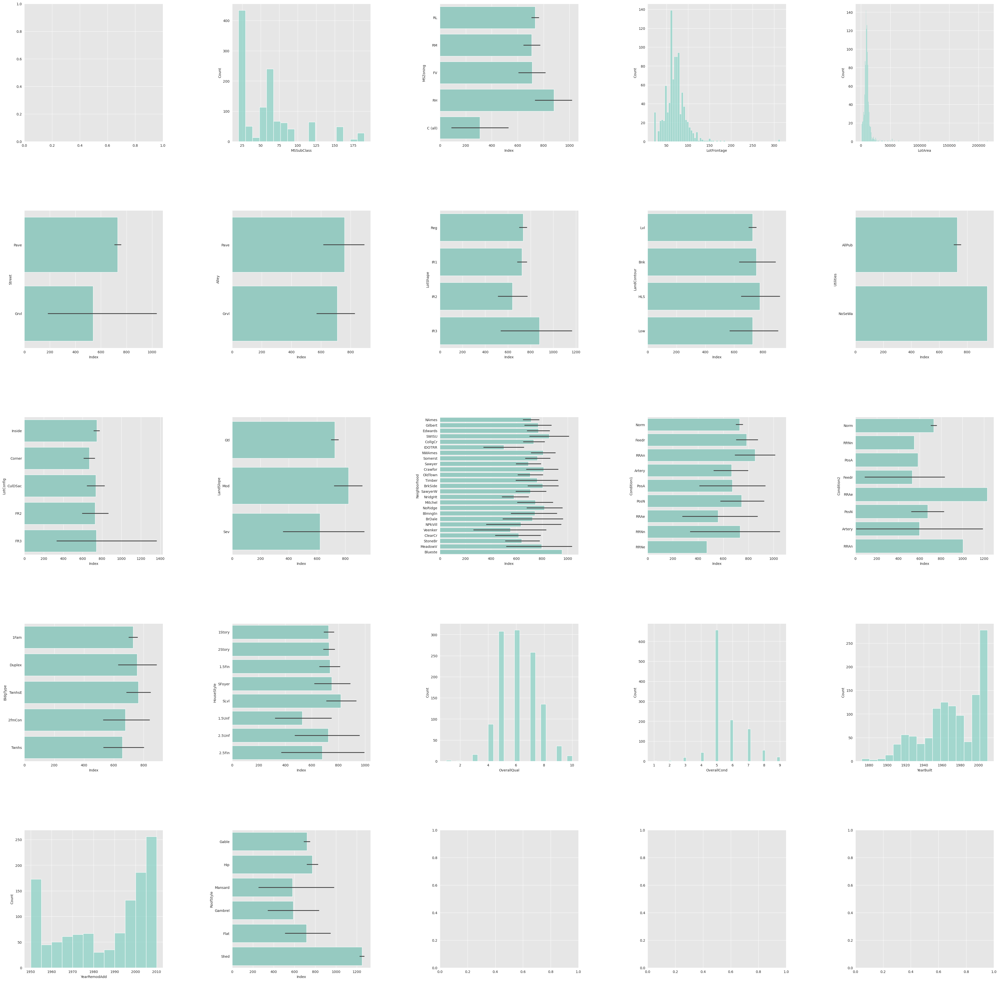

In [12]:
plot_distributions(df=df1,plot_against_target=False)

## Insights 



- Vistina bilo deka mnogu luge kupvele kuki so septichka jama. Ova se odnesvit na Boston. Go proveriv na net, imat i slika od distribucijata vo proof. Znachit deka slikata sho ja dava datasetot za toa e tochna. 
- *YearRemodAdd* e malce chudna kolona. Sfakam deka unverzalen dobar nachin da kazhish deka neshtoto ne si go remodeliral, mada tuka mozda podobro e da kazhime kolku vreme vo godini ne e neshtovo modelirano, nego koga e posledno remodelirano. 
- Za *YearBuilt* isto ko za *YearRemodAdd*, trebat da kazhime kolku e stara, nego koga e izgradena. 
- *BuldingType* i *HouseType* mu se chudni iminjata, ne ja dolovuvaat idejata na podatocite sho gi reprezentiraat. 
- *Condition1* i  *Condition2* se ustvari edno isto, odnosno ako imat kuka sho imat 2 conditions togash gi imat i 2te. Ako pak imat samo 1 condition togash nemat nishto za *Condition2*. Sho znachit mozhit nekako ko torka ovie 2ve da gi reprezentirame, samo trebat da dodajme na condition2 edno null vrednost. Null vrednosta bi znachela deka kukata imat samo 1 condition. 
- So outliers ne trebat nishto da preme, deka ne se greshki, tuku ja dolovuvaat vistinata. Vo smisla ako imat nekoj kupeno kuka so golem lot, to ne znachit deka imat greshka vo merkata na lotot za kukata, tuku deka toj imat mnogu pari. Zaradi to ne trebat takvite samples da gi smetame za "greshni" outliers. 
- Edinicite za tie features sho se numerical se isti, sho znachi deka nemame potreba da gi standardizirame vo odnos na metriki. Metrikata koja ja koristat e feet. Ova informacija mozhit da gi potrebat posle ko ke gi explorvime ostanatite parchinja od datasetot. 

In [13]:
stats_df1=get_statistics_plus_range(df=df1)
stats_df1

,MSSubClass,LotFrontage,LotArea,OverallQual,OverallCond,YearBuilt,YearRemodAdd
count,1168.000000,951.000000,1168.000000,1168.000000,1168.000000,1168.000000,1168.000000
mean,56.849315,70.343849,10689.642123,6.121575,5.584760,1970.965753,1984.897260
std,42.531862,24.897021,10759.366198,1.367619,1.116062,30.675495,20.733955
min,20.000000,21.000000,1300.000000,1.000000,1.000000,1872.000000,1950.000000
25%,20.000000,59.000000,7587.250000,5.000000,5.000000,1953.000000,1966.000000
50%,50.000000,70.000000,9600.000000,6.000000,5.000000,1972.000000,1994.000000
75%,70.000000,80.000000,11700.000000,7.000000,6.000000,2001.000000,2004.000000
max,190.000000,313.000000,215245.000000,10.000000,9.000000,2010.000000,2010.000000
range,170.000000,292.000000,213945.000000,9.000000,8.000000,138.000000,60.000000


Lot area izgledat dosta suspicious so max valueto. 

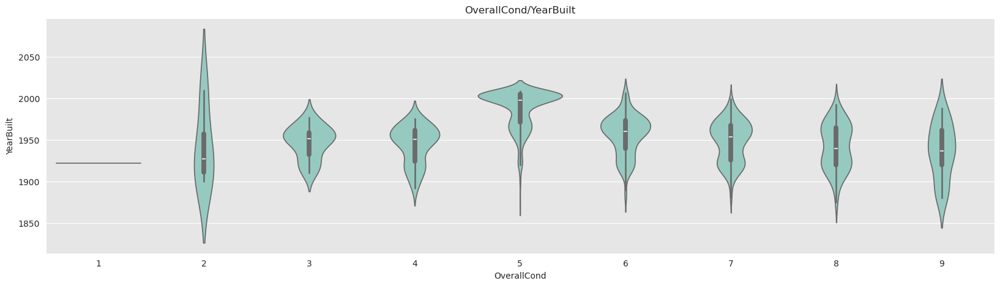

In [14]:
plot_violin_plots(df=df1,x='OverallCond',y='YearBuilt',)

Tuka gledame deka prosechen condition imat novite zgradi, dodeka generalno podobar condition imat postarite zgradi. 

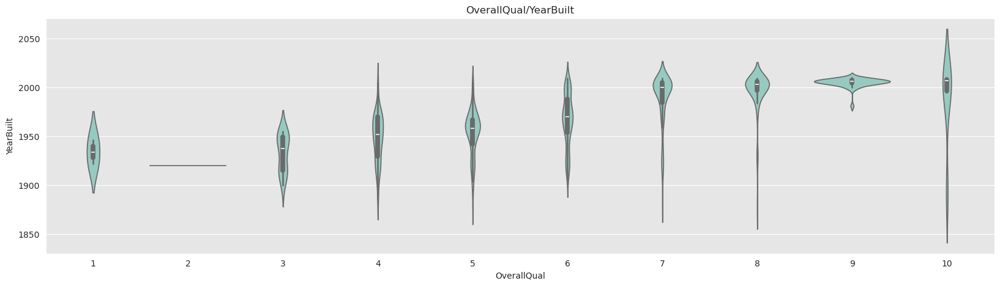

In [15]:
plot_violin_plots(df=df1,x='OverallQual',y='YearBuilt')

Istiot zakluchot go dobivame i tuka 

In [16]:
tmp=df1[['OverallCond','YearBuilt']]
tmp[tmp['OverallCond']==2]

,OverallCond,YearBuilt
Index,,
88,2,1915
676,2,1900
250,2,1940
378,2,2010


## SalePrice against different features 

In [17]:
df1_target=pd.merge(df1,houses_tr[[ID_COL,TARGET_COL]])
df1_target.columns.values

array(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'BldgType', 'HouseStyle', 'OverallQual', 'OverallCond',
       'YearBuilt', 'YearRemodAdd', 'RoofStyle', 'SalePrice'],
      dtype=object)

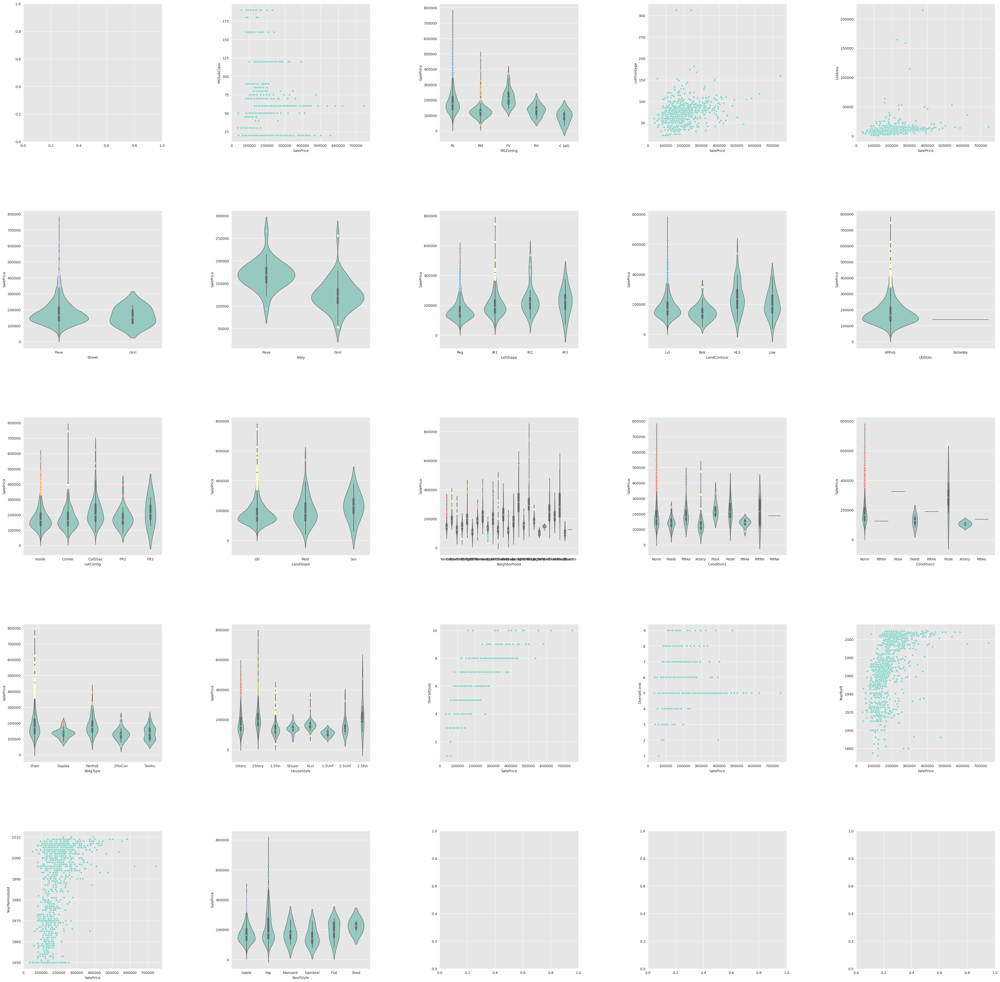

In [18]:
plot_distributions(df=df1_target,plot_against_target=True)

- Pogolemiot del od outlierite vo *SalePrice* imat smisla zoshto se. Najcesto se visoki outliers, odnosno visoki ceni za kuka, no imat smisla deka najcesto se javuvaat za stvarno dobri ponudi. Na pr. imat smisla zoshto kukita za 1 familija da se prodavat poskapo od duplex i od ostanatite poslabi vidovi na objekti.
- Vo *LotFrontage* i *LotArea* nemat smisla outlierite sho gi imame. Na pr. posle istrazuvanje svativ deka 30000 square feet na lot e nevozmozhno neshto. 

## Fixing part1

In [19]:
df1_fix=df1.copy(deep=True)
df1_fix.sample(5)

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle
Index,,,,,,,,,,,,,,,,,,,,,,
1143,1144,20,RL,NaN,9000,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Sawyer,Norm,Norm,1Fam,1Story,5,3,1959,1959,Gable
534,535,60,RL,74.0,9056,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,8,5,2004,2004,Gable
975,976,160,FV,NaN,2651,Pave,NaN,Reg,Lvl,AllPub,FR2,Gtl,Somerst,Norm,Norm,Twnhs,2Story,7,5,2000,2000,Gable
20,21,60,RL,101.0,14215,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NridgHt,Norm,Norm,1Fam,2Story,8,5,2005,2006,Gable
1152,1153,20,RL,90.0,14115,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Crawfor,Norm,Norm,1Fam,1Story,6,7,1956,2004,Gable


### Adding difference between last remodeled and pre sale 

In [20]:
df1_fix=pd.merge(df1_fix,houses_tr[[ID_COL,'YrSold']])
df1_fix.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'YearBuilt', 'YearRemodAdd',
       'RoofStyle', 'YrSold'],
      dtype='object')

In [21]:
df1_fix.loc[:,'AgeFromLastRemodelingPriSale']=df1_fix['YrSold']-df1_fix['YearRemodAdd']
df1_fix['AgeFromLastRemodelingPriSale']

0       53
1       15
2       58
3       57
4       60
        ..
1163     1
1164    59
1165    16
1166     9
1167     2
Name: AgeFromLastRemodelingPriSale, Length: 1168, dtype: int64

In [22]:
df1_fix.drop(['YearBuilt','YearRemodAdd','YrSold'],axis=1,inplace=True)
df1_fix.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2', 'BldgType',
       'HouseStyle', 'OverallQual', 'OverallCond', 'RoofStyle',
       'AgeFromLastRemodelingPriSale'],
      dtype='object')

### Fixing the names of BuildingType and HouseType  

In [23]:
cols=np.array([
    ('HouseStyle','ForFamilyType'),
    ('BldgType','Stories')
])
df1_fix.columns=change_cols_names_return_new(df1_fix,cols)
df1_fix.columns

Index(['Id', 'MSSubClass', 'MSZoning', 'LotFrontage', 'LotArea', 'Street',
       'Alley', 'LotShape', 'LandContour', 'Utilities', 'LotConfig',
       'LandSlope', 'Neighborhood', 'Condition1', 'Condition2',
       'ForFamilyType', 'Stories', 'OverallQual', 'OverallCond', 'RoofStyle',
       'AgeFromLastRemodelingPriSale'],
      dtype='object')

# Exploring part2

In [24]:
df2=df_parts[1]
df2.dtypes

Id                int64
RoofMatl         object
Exterior1st      object
Exterior2nd      object
MasVnrType       object
MasVnrArea      float64
ExterQual        object
ExterCond        object
Foundation       object
BsmtQual         object
BsmtCond         object
BsmtExposure     object
BsmtFinType1     object
BsmtFinSF1        int64
BsmtFinType2     object
BsmtFinSF2        int64
BsmtUnfSF         int64
TotalBsmtSF       int64
Heating          object
HeatingQC        object
CentralAir       object
Electrical       object
dtype: object

In [25]:
get_statistics_plus_range(df2)

,MasVnrArea,BsmtFinSF1,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF
count,1162.000000,1168.000000,1168.000000,1168.000000,1168.000000
mean,103.771945,446.023973,45.152397,570.595034,1061.771404
std,173.032238,459.070977,158.217499,446.364551,440.676330
min,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,0.000000,0.000000,222.500000,796.000000
50%,0.000000,384.500000,0.000000,480.000000,997.500000
75%,166.000000,721.000000,0.000000,810.250000,1299.250000
max,1378.000000,5644.000000,1127.000000,2336.000000,6110.000000
range,1378.000000,5644.000000,1127.000000,2336.000000,6110.000000


In [26]:
has_duplicates(df2)

False

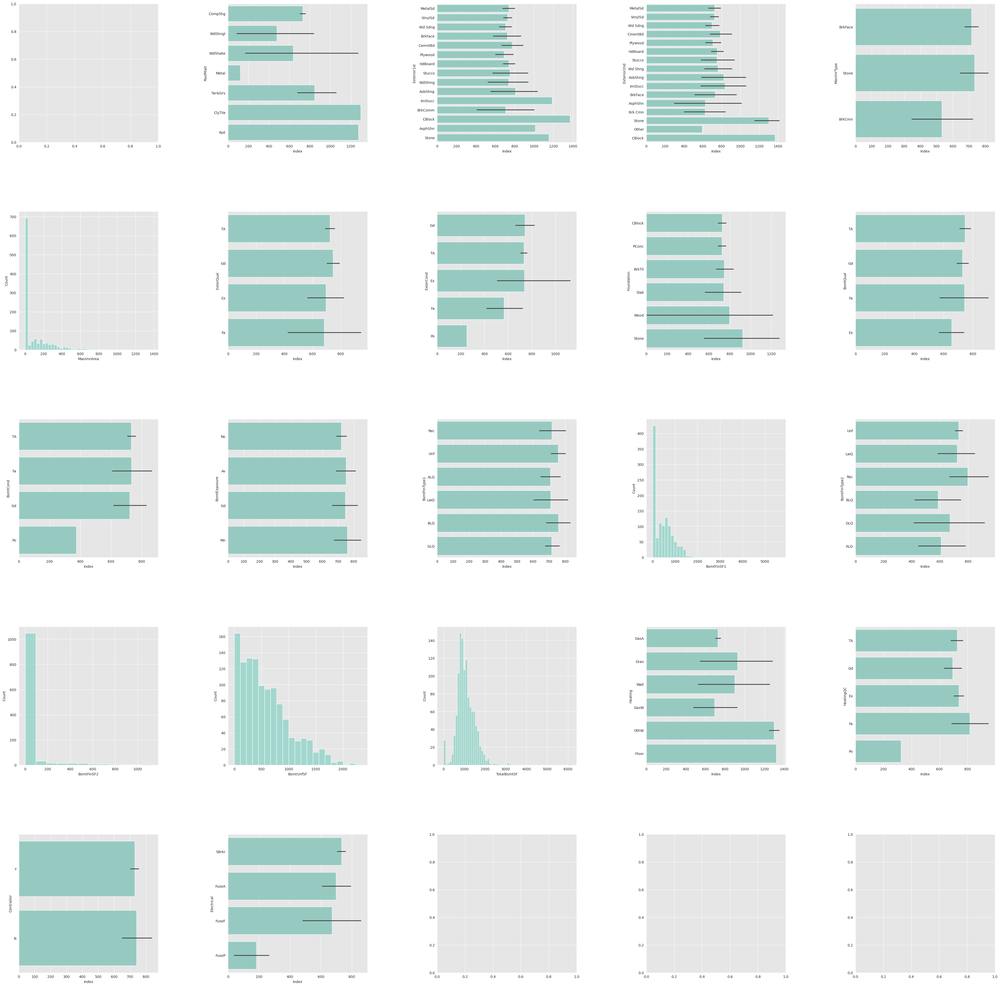

In [27]:
plot_distributions(df2,plot_against_target=False)

### Insights 
- *Extension1* i *Extension2* se isti ko Conditions vo prethodniot del. Znachit mozhit istata finta da ja napreme tuka, so kombiniranjeto. 
- Masonry veneer area imat smisla zoshto e tolku scewed. Ova se odnesvit na sidot kolkav e vo shirina. Bidejki nemat smisla eptem debeli sidovi da se chesti, zto modata e skros levo, taka da drzhit voda. 
- Basement squared feet za kuki so eden i so pojke basements isto imat smisla zoshto se sceewed ko masonry veneer area. Iminjata za basement mojt da se smenat, deka ne ja dolovuvaat idejata. 
- Pojketo kuki se za prodavanje, sho bi znacelo deka total unfinished basement area ke e malo i to go kazvat podatocite. 
- total basement area imat eden spike na pomali vrednosti, to se dolzhit na kukive sho imat mal basement. To se gledat od distribuciite na basement area za privot i za vtoriot basement.  

## Check za total basement area dali e basemenet area1 + basemenet area2

In [28]:
BASEMENT_COL_SURF=[
    'BsmtFinSF1',
    'BsmtFinSF2'
]
TOTAL_BASEMENT_SF_COL='TotalBsmtSF'

In [29]:
sum_ser=pd.Series(np.zeros(shape=df2.shape[0]))
sum_ser.index=df2.index
sum_ser

Index
254     0.0
1066    0.0
638     0.0
799     0.0
380     0.0
       ... 
1095    0.0
1130    0.0
1294    0.0
860     0.0
1126    0.0
Length: 1168, dtype: float64

In [30]:
for col in BASEMENT_COL_SURF:
    sum_ser+=df2[col]
sum_ser==df2[TOTAL_BASEMENT_SF_COL]

Index
254     False
1066    False
638     False
799     False
380     False
        ...  
1095    False
1130    False
1294    False
860     False
1126    False
Length: 1168, dtype: bool

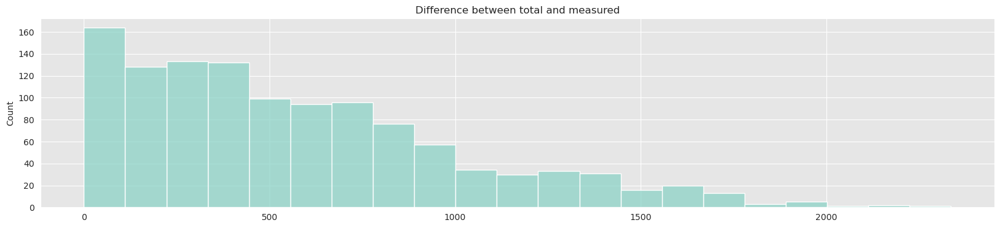

In [31]:
plt.figure(figsize=(20,4))
plt.title('Difference between total and measured')
sns.histplot(df2[TOTAL_BASEMENT_SF_COL]-sum_ser) 
plt.show()

Ne vidov ubo vo descriptionot. TotalBsmtArea znachit kolku e celiot basement, dodeka ovie drugive 2 se kolku square foot se zavrsheni.

In [32]:
df2_target=pd.merge(houses_tr[[TARGET_COL,ID_COL]],df2)
df2_target.columns

Index(['SalePrice', 'Id', 'RoofMatl', 'Exterior1st', 'Exterior2nd',
       'MasVnrType', 'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation',
       'BsmtQual', 'BsmtCond', 'BsmtExposure', 'BsmtFinType1', 'BsmtFinSF1',
       'BsmtFinType2', 'BsmtFinSF2', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating',
       'HeatingQC', 'CentralAir', 'Electrical'],
      dtype='object')

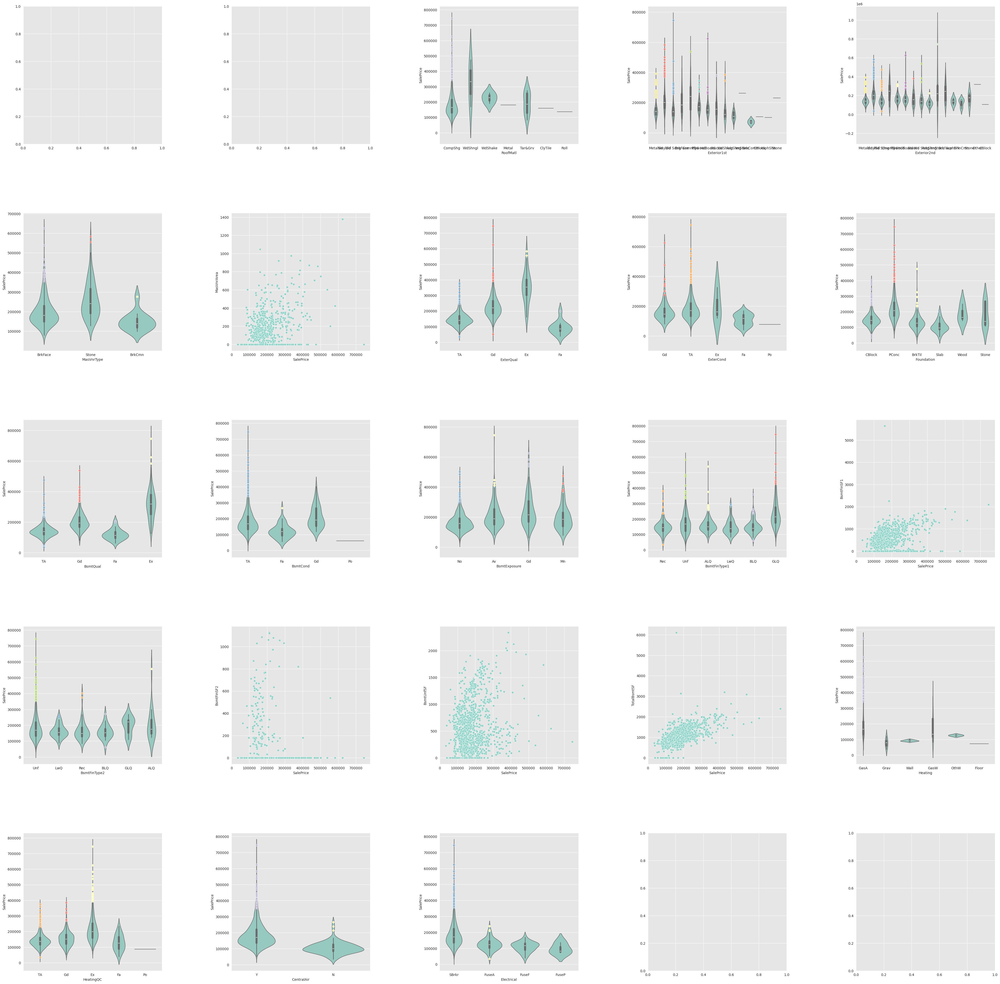

In [33]:
plot_distributions(df2_target,plot_against_target=True)

### Insights 
- Lugjevo mnogu pari davat za unfinished basemenets. 

## Fixing part2 

In [34]:
df2_fix=df2.copy(deep=True)

### Reimenuvanje na basement kolonite 

In [35]:
cols=np.array([
    ('BsmtFinType1','Bsmt1Type'),
    ('BsmtFinSF1','Bsmt1Sf'),
    ('BsmtFinType2','Bsmt2Type'),
    ('BsmtFinSF2','Bsmt2Sf')
])
df2_fix.columns=change_cols_names_return_new(df2_fix,cols)
df2_fix.columns

Index(['Id', 'RoofMatl', 'Exterior1st', 'Exterior2nd', 'MasVnrType',
       'MasVnrArea', 'ExterQual', 'ExterCond', 'Foundation', 'BsmtQual',
       'BsmtCond', 'BsmtExposure', 'Bsmt1Type', 'Bsmt1Sf', 'Bsmt2Type',
       'Bsmt2Sf', 'BsmtUnfSF', 'TotalBsmtSF', 'Heating', 'HeatingQC',
       'CentralAir', 'Electrical'],
      dtype='object')

# Exploring Part 3

In [36]:
df3=df_parts[2]
df3.dtypes

Id                int64
1stFlrSF          int64
2ndFlrSF          int64
LowQualFinSF      int64
GrLivArea         int64
BsmtFullBath      int64
BsmtHalfBath      int64
FullBath          int64
HalfBath          int64
BedroomAbvGr      int64
KitchenAbvGr      int64
KitchenQual      object
TotRmsAbvGrd      int64
Functional       object
Fireplaces        int64
FireplaceQu      object
GarageType       object
GarageYrBlt     float64
GarageFinish     object
GarageCars        int64
GarageArea        int64
GarageQual       object
dtype: object

In [37]:
has_duplicates(df3)

False

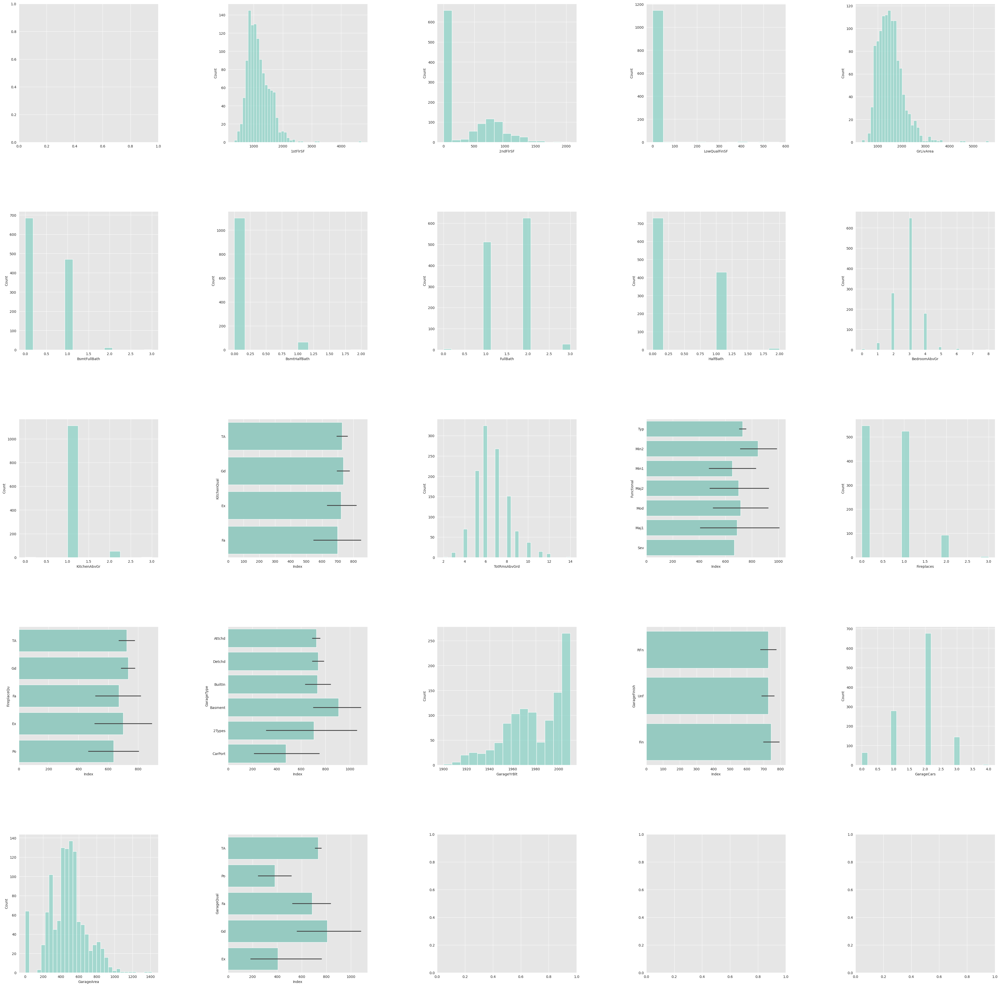

In [38]:
plot_distributions(df3)

### Insights 

- 1stFloorSquareFeet imat smisla zsh imat pogolemi vrednosti od 2stFloorSquareFeet.
- Unfinished isto imat smisla zsh modata mu e mnogu mala, deka kukive se za prodavanje, pa znachit deka pomalce sqaure feet ke imat za dovrsvenje.
- Isto brojot na grazhi imat smisla zsh modata mu e 2. 
- Za garage area pretpostavuvam toj pikot sho e levo se dolzhit na kukite sho nemat garazhi 
- Samo GarageBuiltYear ke imat pojke smisla da e "kolku e garazhata stara", nego koga e izgradena. 

### Kuki sho nemat garazhi 

In [39]:
( df3[df3['GarageArea']==0].shape[0] / df3.shape[0] )  * 100 

5.47945205479452

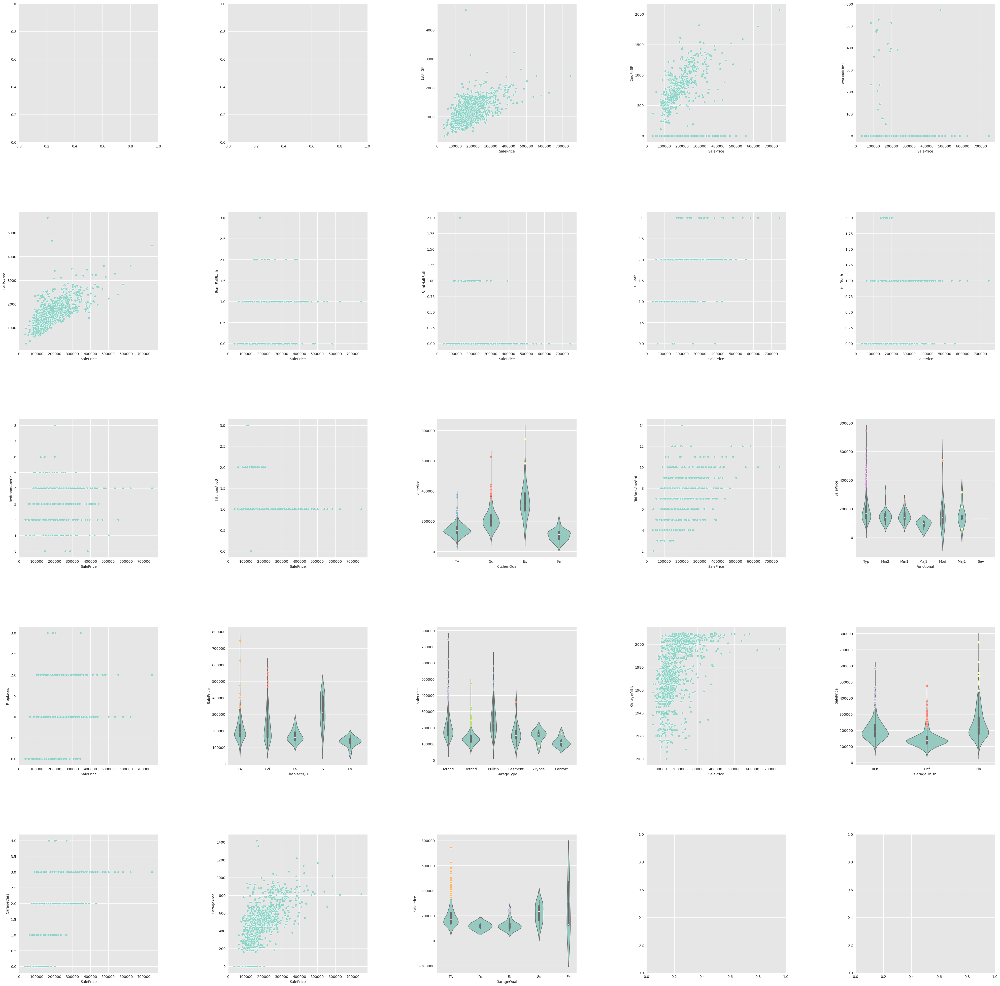

In [40]:
df3_target=pd.merge(houses_tr[[ID_COL,TARGET_COL]],df3)
plot_distributions(df3_target,plot_against_target=True)

### Insights 

- Outliers vo odnos na SalePrice imat smisla, bidejki imat smisla za prosechni i nad prosechni vrednosti za ostanatite vrednosti (ko ke recham prosechni mislam na vrednost na feature koj se odnesuvaat na podobri odliki za kukata). 
- Imat smisla zsh bi ne interesiralo kolku e stara garazhata koga kukata e prodadena. 

### Fixing part 3

In [41]:
df3_fix=df3.copy(deep=True)

#### Age of the garage when selling 

In [42]:
df3_fix=pd.merge(df3_fix,houses_tr[[ID_COL,'YrSold']])
df3_fix.columns

Index(['Id', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea',
       'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr',
       'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional',
       'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageYrBlt',
       'GarageFinish', 'GarageCars', 'GarageArea', 'GarageQual', 'YrSold'],
      dtype='object')

In [43]:
NEW_COL='GarageAgePriSale'
df3_fix.loc[:,NEW_COL]=df3_fix['YrSold']-df3_fix['GarageYrBlt']
df3_fix[NEW_COL]

0       53.0
1       16.0
2        NaN
3       68.0
4       86.0
        ... 
1163     1.0
1164    28.0
1165    49.0
1166    82.0
1167     2.0
Name: GarageAgePriSale, Length: 1168, dtype: float64

In [44]:
df3_fix.drop(['GarageYrBlt','YrSold'],axis=1,inplace=True)
df3_fix.columns

Index(['Id', '1stFlrSF', '2ndFlrSF', 'LowQualFinSF', 'GrLivArea',
       'BsmtFullBath', 'BsmtHalfBath', 'FullBath', 'HalfBath', 'BedroomAbvGr',
       'KitchenAbvGr', 'KitchenQual', 'TotRmsAbvGrd', 'Functional',
       'Fireplaces', 'FireplaceQu', 'GarageType', 'GarageFinish', 'GarageCars',
       'GarageArea', 'GarageQual', 'GarageAgePriSale'],
      dtype='object')

# Exploring part 4

In [45]:
df4=df_parts[3]
df4.dtypes

Id                int64
GarageCond       object
PavedDrive       object
WoodDeckSF        int64
OpenPorchSF       int64
EnclosedPorch     int64
3SsnPorch         int64
ScreenPorch       int64
PoolArea          int64
PoolQC           object
Fence            object
MiscFeature      object
MiscVal           int64
MoSold            int64
YrSold            int64
SaleType         object
SaleCondition    object
SalePrice         int64
dtype: object

In [46]:
has_duplicates(df4)

False

In [47]:
duplicates=df4.duplicated()
duplicates[duplicates]

Series([], dtype: bool)

In [48]:
houses_tr[duplicates]

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
Index,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,,


Ko ke gi zemime ostanatite features vo predvid ne se bash duplikati

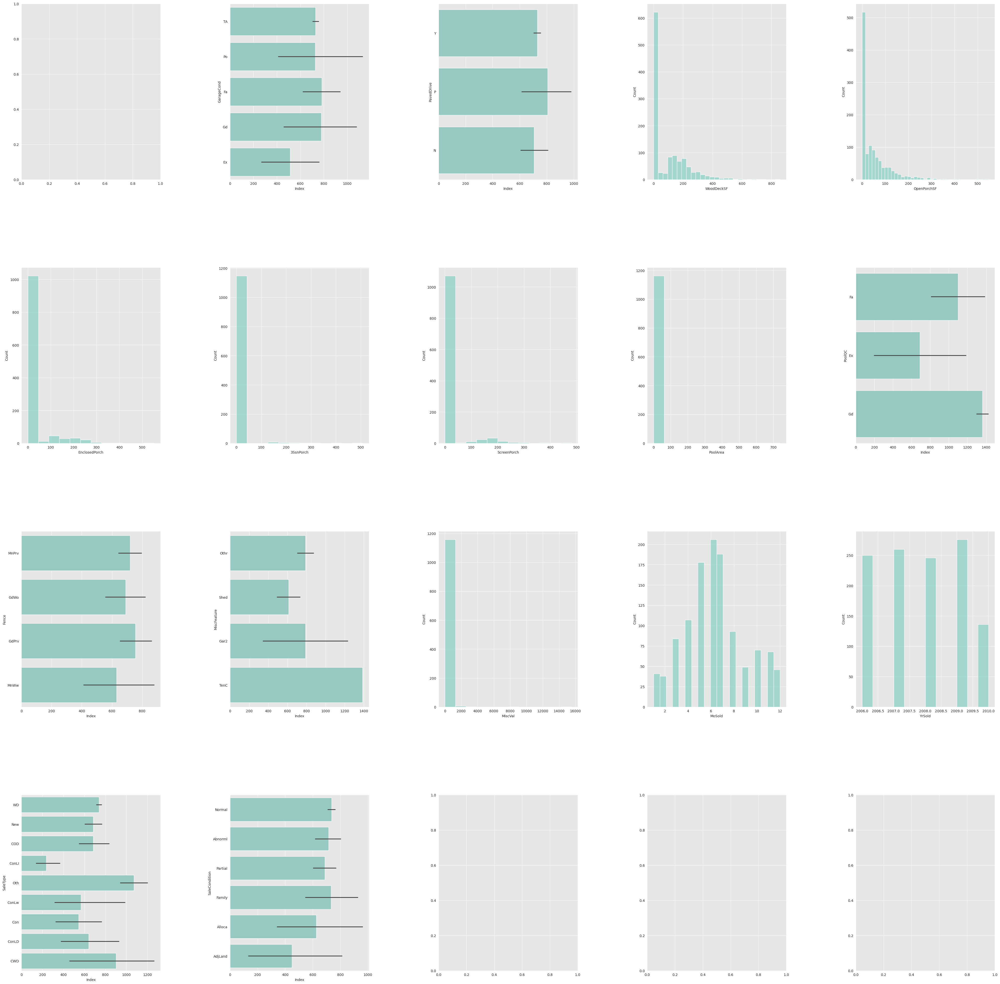

In [49]:
plot_distributions(df4)

### Insights 

- Nemat nekoj eptem suspicious raboti. 
- Edinstveno YrSold trebat da go trgnime, deka kako takvo ne ni davat mnogu informacija. Pobitno bi ni bilo kolku vreme pominalo od poslednata renovacija/gradba pa do saleot za da vidime kolku e tredot na godini za kukite.

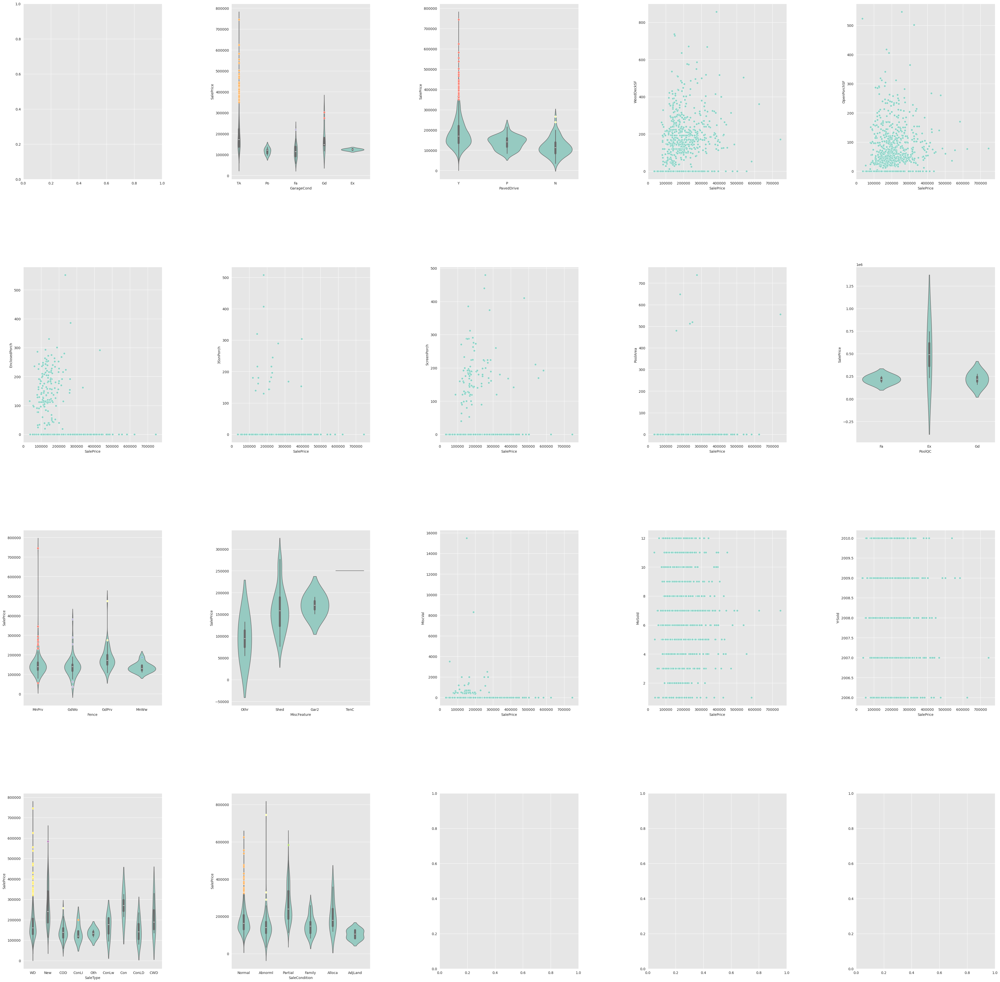

In [50]:
plot_distributions(df4,plot_against_target=True)

### Insights 

- Nemat nekoj suspecious neshta vo datasetot.

## Fxing part4 

Nemat nishto za fixvenje 

# Join the different parts 

In [51]:
house_tr_fix=pd.merge(df1_fix,df2_fix)
house_tr_fix=pd.merge(house_tr_fix,df3_fix)
house_tr_fix=pd.merge(house_tr_fix,df4)
house_tr_fix.drop('YrSold',inplace=True,axis=1)
house_tr_fix

,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,ForFamilyType,Stories,OverallQual,OverallCond,RoofStyle,AgeFromLastRemodelingPriSale,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,Bsmt1Type,Bsmt1Sf,Bsmt2Type,Bsmt2Sf,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageAgePriSale,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,SaleType,SaleCondition,SalePrice
0,255,20,RL,70.0,8400,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NAmes,Norm,Norm,1Fam,1Story,5,6,Gable,53,CompShg,MetalSd,MetalSd,NaN,0.0,TA,Gd,CBlock,TA,TA,No,Rec,922,Unf,0,392,1314,GasA,TA,Y,SBrkr,1314,0,0,1314,1,0,1,0,3,1,TA,5,Typ,0,NaN,Attchd,RFn,1,294,TA,53.0,TA,Y,250,0,0,0,0,0,NaN,NaN,NaN,0,6,WD,Normal,145000
1,1067,60,RL,59.0,7837,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,Gilbert,Norm,Norm,1Fam,2Story,6,7,Gable,15,CompShg,VinylSd,VinylSd,NaN,0.0,Gd,TA,PConc,Gd,TA,No,Unf,0,Unf,0,799,799,GasA,Gd,Y,SBrkr,799,772,0,1571,0,0,2,1,3,1,TA,7,Typ,1,TA,Attchd,RFn,2,380,TA,16.0,TA,Y,0,40,0,0,0,0,NaN,NaN,NaN,0,5,WD,Normal,178000
2,639,30,RL,67.0,8777,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Feedr,Norm,1Fam,1Story,5,7,Gable,58,CompShg,MetalSd,Wd Sdng,NaN,0.0,TA,TA,CBlock,Fa,TA,No,Unf,0,Unf,0,796,796,GasA,Gd,Y,FuseA,796,0,0,796,0,0,1,0,2,1,TA,4,Typ,0,NaN,NaN,NaN,0,0,NaN,NaN,NaN,P,328,0,164,0,0,0,NaN,MnPrv,NaN,0,5,WD,Normal,85000
3,800,50,RL,60.0,7200,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,SWISU,Feedr,Norm,1Fam,1.5Fin,5,7,Gable,57,CompShg,Wd Sdng,Wd Sdng,BrkFace,252.0,TA,TA,BrkTil,Gd,TA,No,ALQ,569,Unf,0,162,731,GasA,Ex,Y,SBrkr,981,787,0,1768,1,0,1,1,3,1,Gd,7,Typ,2,TA,Detchd,Unf,1,240,TA,68.0,TA,Y,0,0,264,0,0,0,NaN,MnPrv,NaN,0,6,WD,Normal,175000
4,381,50,RL,50.0,5000,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,SWISU,Norm,Norm,1Fam,1.5Fin,5,6,Gable,60,CompShg,BrkFace,Wd Sdng,NaN,0.0,TA,TA,BrkTil,TA,TA,No,LwQ,218,Unf,0,808,1026,GasA,TA,Y,SBrkr,1026,665,0,1691,0,0,2,0,3,1,Gd,6,Typ,1,Gd,Detchd,Unf,1,308,TA,86.0,TA,Y,0,0,242,0,0,0,NaN,NaN,NaN,0,5,WD,Normal,127000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1163,1096,20,RL,78.0,9317,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,CollgCr,Norm,Norm,1Fam,1Story,6,5,Gable,1,CompShg,VinylSd,VinylSd,NaN,0.0,Gd,TA,PConc,Gd,TA,No,GLQ,24,Unf,0,1290,1314,GasA,Gd,Y,SBrkr,1314,0,0,1314,0,0,2,0,3,1,Gd,6,Typ,1,Gd,Attchd,RFn,2,440,TA,1.0,TA,Y,0,22,0,0,0,0,NaN,NaN,NaN,0,3,WD,Normal,176432
1164,1131,50,RL,65.0,7804,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,SWISU,Norm,Norm,1Fam,1.5Fin,4,3,Gable,59,CompShg,WdShing,Plywood,NaN,0.0,TA,TA,BrkTil,TA,TA,No,BLQ,622,Unf,0,500,1122,GasA,TA,Y,SBrkr,1328,653,0,1981,1,0,2,0,4,1,Gd,7,Min2,2,TA,Detchd,Unf,2,576,TA,28.0,TA,Y,431,44,0,0,0,0,NaN,MnPrv,NaN,0,12,WD,Normal,135000
1165,1295,20,RL,60.0,8172,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,1Fam,1Story,5,7,Hip,16,CompShg,WdShing,Plywood,NaN,0.0,TA,TA,CBlock,TA,TA,No,Rec,167,Unf,0,697,864,GasA,TA,Y,SBrkr,864,0,0,864,1,0,1,0,2,1,TA,5,Typ,0,NaN,Detchd,Unf,2,572,TA,49.0,TA,N,0,0,0,0,0,0,NaN,NaN,NaN,0,4,WD,Normal,115000
1166,861,50,RL,55.0,7642,Pave,NaN,Reg,Lvl,AllPub,Corner,Gtl,Crawfor,Norm,Norm,1Fam,1.5Fin,7,8,Gable,9,CompShg,Wd Sdng,Wd Sdng,NaN,0.0,Gd,TA,BrkTil,TA,TA,No,Unf,0,Unf,0,912,912,GasA,Gd,Y,SBrkr,912,514,0,1426,0,0,1,1,3,1,Gd,7,Typ,1,Gd,Detchd,Unf,1,216,TA,82.0,TA,Y,0,240,0,0,0,0,NaN,GdPrv,NaN,0,6,WD,Normal,189950


In [52]:
house_tr_fix.shape

(1168, 79)

# Handling missing values 

In [53]:
find_missing_vals(houses_tr)

LotFrontage      217
Alley           1094
MasVnrType       683
MasVnrArea         6
BsmtQual          28
BsmtCond          28
BsmtExposure      28
BsmtFinType1      28
BsmtFinType2      28
Electrical         1
FireplaceQu      547
GarageType        64
GarageYrBlt       64
GarageFinish      64
GarageQual        64
GarageCond        64
PoolQC          1162
Fence            935
MiscFeature     1122
dtype: int64

In [54]:
house_tr_fix[house_tr_fix['Alley']=='NA'],house_tr_fix['Alley'].value_counts()

(Empty DataFrame
 Columns: [Id, MSSubClass, MSZoning, LotFrontage, LotArea, Street, Alley, LotShape, LandContour, Utilities, LotConfig, LandSlope, Neighborhood, Condition1, Condition2, ForFamilyType, Stories, OverallQual, OverallCond, RoofStyle, AgeFromLastRemodelingPriSale, RoofMatl, Exterior1st, Exterior2nd, MasVnrType, MasVnrArea, ExterQual, ExterCond, Foundation, BsmtQual, BsmtCond, BsmtExposure, Bsmt1Type, Bsmt1Sf, Bsmt2Type, Bsmt2Sf, BsmtUnfSF, TotalBsmtSF, Heating, HeatingQC, CentralAir, Electrical, 1stFlrSF, 2ndFlrSF, LowQualFinSF, GrLivArea, BsmtFullBath, BsmtHalfBath, FullBath, HalfBath, BedroomAbvGr, KitchenAbvGr, KitchenQual, TotRmsAbvGrd, Functional, Fireplaces, FireplaceQu, GarageType, GarageFinish, GarageCars, GarageArea, GarageQual, GarageAgePriSale, GarageCond, PavedDrive, WoodDeckSF, OpenPorchSF, EnclosedPorch, 3SsnPorch, ScreenPorch, PoolArea, PoolQC, Fence, MiscFeature, MiscVal, MoSold, SaleType, SaleCondition, SalePrice]
 Index: [],
 Alley
 Grvl    44
 Pave    30
 

In [55]:
house_tr_fix[house_tr_fix['MasVnrType']=='None'],house_tr_fix['MasVnrType'].value_counts()

(Empty DataFrame
 Columns: [Id, MSSubClass, MSZoning, LotFrontage, LotArea, Street, Alley, LotShape, LandContour, Utilities, LotConfig, LandSlope, Neighborhood, Condition1, Condition2, ForFamilyType, Stories, OverallQual, OverallCond, RoofStyle, AgeFromLastRemodelingPriSale, RoofMatl, Exterior1st, Exterior2nd, MasVnrType, MasVnrArea, ExterQual, ExterCond, Foundation, BsmtQual, BsmtCond, BsmtExposure, Bsmt1Type, Bsmt1Sf, Bsmt2Type, Bsmt2Sf, BsmtUnfSF, TotalBsmtSF, Heating, HeatingQC, CentralAir, Electrical, 1stFlrSF, 2ndFlrSF, LowQualFinSF, GrLivArea, BsmtFullBath, BsmtHalfBath, FullBath, HalfBath, BedroomAbvGr, KitchenAbvGr, KitchenQual, TotRmsAbvGrd, Functional, Fireplaces, FireplaceQu, GarageType, GarageFinish, GarageCars, GarageArea, GarageQual, GarageAgePriSale, GarageCond, PavedDrive, WoodDeckSF, OpenPorchSF, EnclosedPorch, 3SsnPorch, ScreenPorch, PoolArea, PoolQC, Fence, MiscFeature, MiscVal, MoSold, SaleType, SaleCondition, SalePrice]
 Index: [],
 MasVnrType
 BrkFace    366
 Sto

In [56]:
house_tr_fix[house_tr_fix['BsmtQual']=='NA'],house_tr_fix['BsmtQual'].value_counts()

(Empty DataFrame
 Columns: [Id, MSSubClass, MSZoning, LotFrontage, LotArea, Street, Alley, LotShape, LandContour, Utilities, LotConfig, LandSlope, Neighborhood, Condition1, Condition2, ForFamilyType, Stories, OverallQual, OverallCond, RoofStyle, AgeFromLastRemodelingPriSale, RoofMatl, Exterior1st, Exterior2nd, MasVnrType, MasVnrArea, ExterQual, ExterCond, Foundation, BsmtQual, BsmtCond, BsmtExposure, Bsmt1Type, Bsmt1Sf, Bsmt2Type, Bsmt2Sf, BsmtUnfSF, TotalBsmtSF, Heating, HeatingQC, CentralAir, Electrical, 1stFlrSF, 2ndFlrSF, LowQualFinSF, GrLivArea, BsmtFullBath, BsmtHalfBath, FullBath, HalfBath, BedroomAbvGr, KitchenAbvGr, KitchenQual, TotRmsAbvGrd, Functional, Fireplaces, FireplaceQu, GarageType, GarageFinish, GarageCars, GarageArea, GarageQual, GarageAgePriSale, GarageCond, PavedDrive, WoodDeckSF, OpenPorchSF, EnclosedPorch, 3SsnPorch, ScreenPorch, PoolArea, PoolQC, Fence, MiscFeature, MiscVal, MoSold, SaleType, SaleCondition, SalePrice]
 Index: [],
 BsmtQual
 TA    521
 Gd    493


In [57]:
bsmt=house_tr_fix.filter(regex='^Bsmt')
bsmt[bsmt.isna()].sample(2)

,BsmtQual,BsmtCond,BsmtExposure,Bsmt1Type,Bsmt1Sf,Bsmt2Type,Bsmt2Sf,BsmtUnfSF,BsmtFullBath,BsmtHalfBath
1010,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
748,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [58]:
garage=house_tr_fix.filter(regex='^Garage')
garage[garage.isna()].sample(2)

,GarageType,GarageFinish,GarageCars,GarageArea,GarageQual,GarageAgePriSale,GarageCond
155,NaN,NaN,NaN,NaN,NaN,NaN,NaN
159,NaN,NaN,NaN,NaN,NaN,NaN,NaN


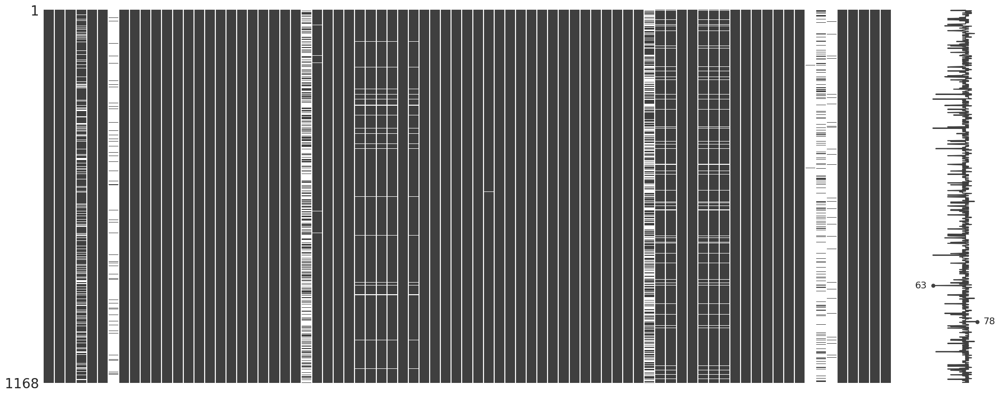

In [59]:
msno.matrix(house_tr_fix)
plt.show()

- Alley imat posebni vrednosti na Nan, odnosno deka nema 

In [60]:
make_column_selector(pattern='^Garage')(house_tr_fix)

['GarageType',
 'GarageFinish',
 'GarageCars',
 'GarageArea',
 'GarageQual',
 'GarageAgePriSale',
 'GarageCond']

In [61]:
house_tr_fix=house_tr_fix.rename(str,axis="columns")

In [62]:
trans=make_column_transformer(
    (SimpleImputer(fill_value='NA',strategy='constant'), ['Alley','MasVnrType','FireplaceQu','PoolQC','Fence','MiscFeature','GarageType','GarageFinish','GarageQual','GarageCond']),
    (SimpleImputer(fill_value='NA',strategy='constant'),make_column_selector(pattern='^Bsmt')),
    (SimpleImputer(strategy='most_frequent'),['Electrical']),
    (SimpleImputer(strategy='median'),['MasVnrArea','LotFrontage']),
    (SimpleImputer(strategy='constant',fill_value=-1),['GarageAgePriSale']),
    remainder='passthrough' 
)
house_tr_no_nans=make_pd_from_col_trans(trans.fit_transform(house_tr_fix),trans)
find_missing_vals(house_tr_no_nans)

Series([], dtype: int64)

# Correlation and relationship between features  

In [63]:
houses_tr_nonans_enc=house_tr_no_nans.copy(deep=True)

In [64]:
col_map:dict =json.load(open('../shared-code/lb_enc.json'))
col_map.update(json.load(open('../shared-code/ordinal_cols.json')))
cols_enc=list(col_map.keys())

oe=OrdinalEncoder(categories=[col_map[col] for col in cols_enc])
houses_tr_nonans_enc.loc[:,cols_enc]=oe.fit_transform(houses_tr_nonans_enc[cols_enc])
houses_tr_nonans_enc.sample(2)

,Alley,MasVnrType,FireplaceQu,PoolQC,Fence,MiscFeature,GarageType,GarageFinish,GarageQual,GarageCond,BsmtQual,BsmtCond,BsmtExposure,Bsmt1Type,Bsmt1Sf,Bsmt2Type,Bsmt2Sf,BsmtUnfSF,BsmtFullBath,BsmtHalfBath,Electrical,MasVnrArea,LotFrontage,GarageAgePriSale,Id,MSSubClass,MSZoning,LotArea,Street,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,ForFamilyType,Stories,OverallQual,OverallCond,RoofStyle,AgeFromLastRemodelingPriSale,RoofMatl,Exterior1st,Exterior2nd,ExterQual,ExterCond,Foundation,TotalBsmtSF,Heating,HeatingQC,CentralAir,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,GarageCars,GarageArea,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,SaleType,SaleCondition,SalePrice
34,2.0,3.0,0.0,0.0,0.0,5.0,5.0,1.0,3.0,3.0,4.0,3.0,3.0,6.0,685,1.0,0,173,1,0,0.0,0.0,70.0,26.0,771,85,5.0,7252,1.0,2.0,3.0,0.0,2.0,2.0,19.0,2.0,2.0,0.0,5.0,5,5,3.0,27,1.0,15.0,15.0,2.0,2.0,1.0,858,1.0,2.0,1.0,858,0,0,858,1,0,2,1,2.0,5,7.0,0,2,576,2.0,120,0,0,0,0,0,0,4,0.0,0.0,134900
877,2.0,3.0,4.0,0.0,0.0,5.0,1.0,1.0,3.0,3.0,3.0,3.0,1.0,1.0,0,1.0,0,912,0,1,0.0,0.0,78.0,62.0,659,50,5.0,17503,1.0,3.0,3.0,0.0,0.0,2.0,12.0,0.0,2.0,0.0,4.0,6,5,1.0,60,1.0,14.0,14.0,2.0,2.0,1.0,912,1.0,2.0,1.0,912,546,0,1458,1,0,3,1,2.0,6,7.0,1,1,330,2.0,192,0,0,0,0,0,0,1,0.0,1.0,97500


In [65]:
houses_tr_nonans_enc=houses_tr_nonans_enc.astype(np.float64)
houses_tr_nonans_enc.dtypes

Alley            float64
MasVnrType       float64
FireplaceQu      float64
PoolQC           float64
Fence            float64
                  ...   
MiscVal          float64
MoSold           float64
SaleType         float64
SaleCondition    float64
SalePrice        float64
Length: 79, dtype: object

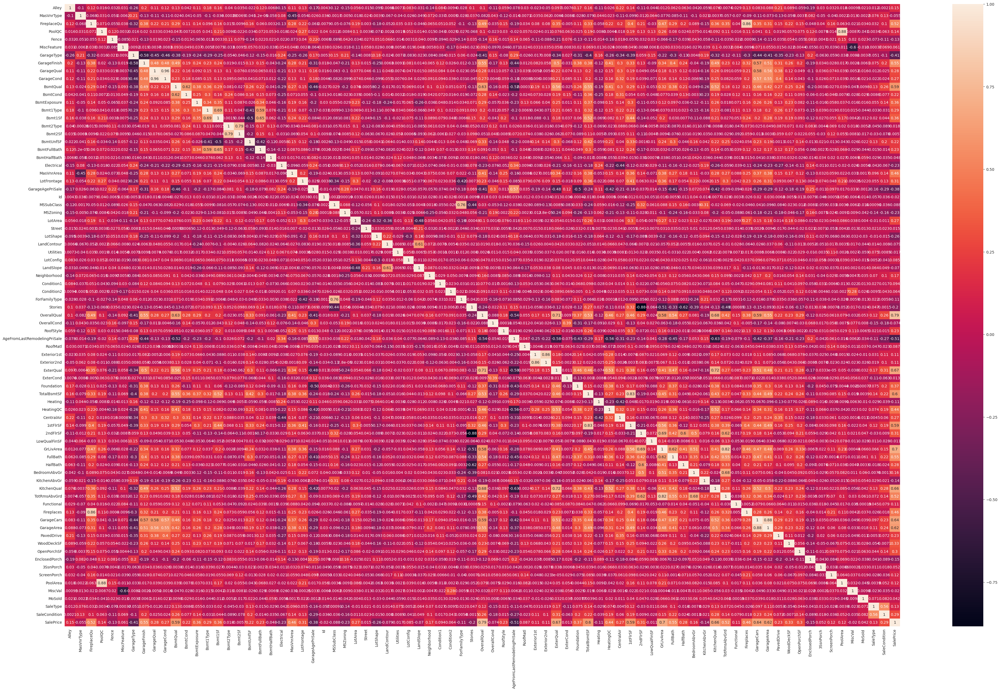

In [66]:
plt.figure(figsize=(50,30))
corr=houses_tr_nonans_enc.corr()
sns.heatmap(corr,annot=True)
plt.show()

# Pipeline for models 

In [67]:
train=pd.read_csv('../data/train.csv')
train.drop('SalePrice',axis=1,inplace=True)
train.sample(5)

,Index,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition
1121,840,841,70,RH,NaN,12155,Pave,NaN,IR1,Lvl,AllPub,Inside,Gtl,SWISU,Norm,Norm,1Fam,2Story,6,8,1925,1950,Gable,CompShg,Wd Sdng,Wd Sdng,NaN,0.0,TA,TA,BrkTil,TA,TA,No,BLQ,156,Unf,0,516,672,GasA,TA,N,SBrkr,810,672,0,1482,0,0,2,0,4,1,Fa,7,Typ,0,NaN,Detchd,1934.0,Unf,1,400,TA,TA,P,0,0,254,0,0,0,NaN,NaN,NaN,0,3,2008,WD,Normal
74,810,811,20,RL,78.0,10140,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,NWAmes,Norm,Norm,1Fam,1Story,6,6,1974,1999,Hip,CompShg,HdBoard,HdBoard,BrkFace,99.0,TA,TA,CBlock,TA,TA,No,ALQ,663,LwQ,377,0,1040,GasA,Fa,Y,SBrkr,1309,0,0,1309,1,0,1,1,3,1,Gd,5,Typ,1,Fa,Attchd,1974.0,RFn,2,484,TA,TA,Y,265,0,0,0,0,648,Fa,GdPrv,NaN,0,1,2006,WD,Normal
420,434,435,180,RM,21.0,1890,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,MeadowV,Norm,Norm,Twnhs,SFoyer,4,7,1972,1972,Gable,CompShg,CemntBd,CmentBd,NaN,0.0,TA,Gd,CBlock,Gd,TA,Av,ALQ,495,Unf,0,135,630,GasA,Gd,Y,SBrkr,630,0,0,630,1,0,1,0,1,1,TA,3,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,Y,88,0,0,0,0,0,NaN,NaN,NaN,0,6,2008,WD,Normal
246,171,172,20,RL,141.0,31770,Pave,NaN,IR1,Lvl,AllPub,Corner,Gtl,NAmes,Norm,Norm,1Fam,1Story,6,5,1960,1960,Hip,CompShg,BrkFace,Plywood,Stone,112.0,TA,TA,CBlock,TA,Gd,Gd,BLQ,639,Unf,0,441,1080,GasA,Fa,Y,SBrkr,1656,0,0,1656,1,0,1,0,3,1,TA,7,Typ,2,Gd,Attchd,1960.0,Fin,2,528,TA,TA,P,210,62,0,0,0,0,NaN,NaN,NaN,0,5,2010,WD,Normal
196,461,462,70,RL,60.0,7200,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,SWISU,Feedr,Norm,1Fam,2Story,7,9,1936,2007,Gable,CompShg,Wd Sdng,Wd Sdng,NaN,0.0,Gd,Gd,PConc,Gd,Gd,No,ALQ,350,BLQ,210,0,560,GasA,Ex,Y,SBrkr,575,560,0,1135,1,0,1,0,3,1,Gd,6,Typ,0,NaN,Detchd,1971.0,RFn,2,576,TA,TA,Y,256,0,0,0,0,0,NaN,MnPrv,NaN,0,4,2009,WD,Normal


In [68]:
msn_imp = make_column_transformer(
    (
        SimpleImputer(fill_value="NA", strategy="constant"),
        [
            "Alley",
            "MasVnrType",
            "FireplaceQu",
            "PoolQC",
            "Fence",
            "MiscFeature",
            "GarageType",
            "GarageFinish",
            "GarageQual",
            "GarageCond",
        ],
    ),
    (
        SimpleImputer(fill_value="NA", strategy="constant"),
        [
            "BsmtQual",
            "BsmtCond",
            "BsmtExposure",
            "Bsmt1Type",
            "Bsmt2Type",
        ],
    ),
    (SimpleImputer(strategy="most_frequent"), ["Electrical",'BsmtFullBath',"BsmtHalfBath"]),
    (SimpleImputer(strategy="median"), ["MasVnrArea", "LotFrontage","Bsmt1Sf","Bsmt2Sf",'BsmtUnfSF']),
    (SimpleImputer(strategy="constant", fill_value=-1), ["GarageAgePriSale"]),
    remainder="passthrough",
)

ordinal_columns=None 
lb_enc=None 

with open('../shared-code/lb_enc.json') as f: 
    lb_enc=json.load(f)

with open('../shared-code/ordinal_cols.json') as f: 
    ordinal_columns=json.load(f)

oe = OrdinalEncoder(categories=list(ordinal_columns.values()))
oe_no_order = OrdinalEncoder(categories=list(lb_enc.values()))
enc_trans=make_column_transformer(
   (oe,list(ordinal_columns.keys())),
   (oe_no_order,list(lb_enc.keys())),
   remainder="passthrough",
)
imp_test=make_column_transformer(
    (SimpleImputer(strategy='mean'),['Bsmt1Sf','Bsmt2Sf']),
    remainder=SimpleImputer(strategy='most_frequent')
)

In [69]:
data_pipeline = make_pipeline(
    FunctionTransformer(func=modify_features),
    msn_imp,
    FunctionTransformer(func=PdWrapper(msn_imp)),
    imp_test,
    FunctionTransformer(func=PdWrapper(imp_test)),
    enc_trans,
    FunctionTransformer(func=PdWrapper(enc_trans)),
    FunctionTransformer(conv_npfloat64)
)

data_pipeline.fit(train)
data_pipeline.transform(train).sample(5)

,LotShape,LandContour,LandSlope,ExterQual,ExterCond,BsmtQual,BsmtCond,BsmtExposure,Bsmt1Type,Bsmt2Type,HeatingQC,KitchenQual,Functional,FireplaceQu,GarageFinish,GarageQual,GarageCond,PavedDrive,PoolQC,Fence,MSZoning,Street,Alley,Utilities,LotConfig,Neighborhood,Condition1,Condition2,ForFamilyType,Stories,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,Foundation,Heating,CentralAir,Electrical,GarageType,MiscFeature,SaleType,SaleCondition,MasVnrType,Bsmt1Sf,Bsmt2Sf,BsmtFullBath,BsmtHalfBath,MasVnrArea,LotFrontage,BsmtUnfSF,GarageAgePriSale,Index,Id,MSSubClass,LotArea,OverallQual,OverallCond,TotalBsmtSF,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,TotRmsAbvGrd,Fireplaces,GarageCars,GarageArea,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,MiscVal,MoSold,AgeFromLastRemodelingPriSale
632,2.0,3.0,2.0,2.0,2.0,4.0,3.0,1.0,6.0,1.0,4.0,2.0,7.0,0.0,3.0,3.0,3.0,2.0,0.0,2.0,5.0,1.0,2.0,0.0,3.0,5.0,2.0,2.0,0.0,0.0,1.0,1.0,6.0,6.0,1.0,1.0,1.0,0.0,1.0,3.0,0.0,0.0,1.0,378.0,0.0,0.0,0.0,153.0,70.0,311.0,33.0,214.0,215.0,60.0,10900.0,6.0,7.0,689.0,689.0,703.0,0.0,1392.0,1.0,1.0,3.0,1.0,6.0,0.0,1.0,299.0,0.0,36.0,0.0,0.0,0.0,0.0,450.0,3.0,33.0
980,3.0,3.0,2.0,2.0,2.0,3.0,3.0,2.0,5.0,3.0,2.0,2.0,7.0,4.0,1.0,3.0,3.0,2.0,0.0,0.0,5.0,1.0,2.0,0.0,0.0,19.0,2.0,2.0,0.0,6.0,3.0,1.0,15.0,10.0,1.0,1.0,1.0,0.0,1.0,5.0,0.0,1.0,3.0,306.0,1085.0,1.0,0.0,0.0,102.0,372.0,51.0,854.0,855.0,20.0,17920.0,5.0,4.0,1763.0,1779.0,0.0,0.0,1779.0,1.0,1.0,3.0,1.0,6.0,1.0,2.0,454.0,0.0,418.0,0.0,0.0,312.0,0.0,0.0,7.0,32.0
1125,3.0,3.0,2.0,2.0,2.0,4.0,3.0,1.0,1.0,1.0,4.0,3.0,7.0,0.0,2.0,3.0,3.0,2.0,0.0,0.0,2.0,1.0,1.0,0.0,0.0,21.0,2.0,2.0,3.0,0.0,1.0,1.0,8.0,8.0,2.0,1.0,1.0,0.0,5.0,5.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,30.0,600.0,1.0,831.0,832.0,160.0,3180.0,7.0,5.0,600.0,520.0,600.0,80.0,1200.0,2.0,1.0,2.0,1.0,4.0,0.0,2.0,480.0,0.0,166.0,0.0,0.0,0.0,0.0,0.0,6.0,1.0
315,2.0,3.0,2.0,2.0,2.0,4.0,3.0,3.0,1.0,1.0,4.0,3.0,7.0,0.0,3.0,3.0,3.0,2.0,0.0,0.0,5.0,1.0,2.0,0.0,2.0,5.0,2.0,2.0,0.0,0.0,1.0,1.0,14.0,14.0,2.0,1.0,1.0,0.0,1.0,5.0,0.0,0.0,3.0,0.0,0.0,0.0,0.0,0.0,57.0,880.0,10.0,536.0,537.0,60.0,8924.0,7.0,5.0,880.0,880.0,844.0,0.0,1724.0,2.0,1.0,3.0,1.0,8.0,0.0,2.0,527.0,120.0,155.0,0.0,0.0,0.0,0.0,0.0,7.0,9.0
1115,2.0,3.0,2.0,3.0,2.0,4.0,3.0,3.0,1.0,1.0,4.0,3.0,7.0,4.0,2.0,3.0,3.0,2.0,0.0,0.0,5.0,1.0,2.0,0.0,0.0,5.0,2.0,2.0,0.0,6.0,1.0,1.0,14.0,14.0,2.0,1.0,1.0,0.0,1.0,5.0,3.0,5.0,4.0,0.0,0.0,0.0,0.0,306.0,91.0,1494.0,1.0,13.0,14.0,20.0,10652.0,7.0,5.0,1494.0,1494.0,0.0,0.0,1494.0,2.0,0.0,3.0,1.0,7.0,1.0,3.0,840.0,160.0,33.0,0.0,0.0,0.0,0.0,0.0,8.0,0.0


In [70]:
joblib.dump(data_pipeline, '../pipelines/data_pipeline.pkl',compress=True)

['../pipelines/data_pipeline.pkl']

# Check pipeline ability for test dataset

In [71]:
test=pd.read_csv('../data/test.csv')
test.sample(5)

,Index,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice
198,56,57,160,FV,24.0,2645,Pave,Pave,Reg,Lvl,AllPub,Inside,Gtl,Somerst,Norm,Norm,Twnhs,2Story,8,5,1999,2000,Gable,CompShg,MetalSd,MetalSd,BrkFace,456.0,Gd,TA,PConc,Gd,TA,No,GLQ,649,Unf,0,321,970,GasA,Ex,Y,SBrkr,983,756,0,1739,1,0,2,1,3,1,Gd,7,Typ,0,NaN,Attchd,1999.0,Fin,2,480,TA,TA,Y,115,0,0,0,0,0,NaN,NaN,NaN,0,8,2009,WD,Abnorml,172500
243,58,59,60,RL,66.0,13682,Pave,NaN,IR2,HLS,AllPub,CulDSac,Gtl,StoneBr,Norm,Norm,1Fam,2Story,10,5,2006,2006,Hip,CompShg,VinylSd,VinylSd,BrkFace,1031.0,Ex,TA,PConc,Ex,TA,Gd,Unf,0,Unf,0,1410,1410,GasA,Ex,Y,SBrkr,1426,1519,0,2945,0,0,3,1,3,1,Gd,10,Typ,1,Gd,BuiltIn,2006.0,Fin,3,641,TA,TA,Y,192,0,37,0,0,0,NaN,NaN,NaN,0,10,2006,New,Partial,438780
245,535,536,190,RL,70.0,7000,Pave,NaN,Reg,Lvl,AllPub,Inside,Gtl,Edwards,Norm,Norm,2fmCon,2Story,5,7,1910,1991,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,Gd,TA,Gd,GLQ,969,Unf,0,148,1117,GasA,TA,Y,SBrkr,820,527,0,1347,1,0,1,0,3,1,TA,5,Typ,0,NaN,NaN,NaN,NaN,0,0,NaN,NaN,N,85,0,148,0,0,0,NaN,NaN,NaN,0,1,2008,WD,Normal,107500
279,1427,1428,50,RL,60.0,10930,Pave,Grvl,Reg,Bnk,AllPub,Inside,Gtl,NAmes,Artery,Norm,1Fam,1.5Fin,5,6,1945,1950,Gable,CompShg,MetalSd,MetalSd,NaN,0.0,TA,TA,CBlock,TA,TA,No,BLQ,580,Unf,0,333,913,GasA,TA,Y,FuseA,1048,510,0,1558,1,0,1,1,3,1,TA,6,Typ,1,TA,Attchd,1962.0,Unf,1,288,TA,TA,Y,0,0,0,0,0,0,NaN,NaN,NaN,0,4,2008,WD,Normal,140000
250,1430,1431,60,RL,60.0,21930,Pave,NaN,IR3,Lvl,AllPub,Inside,Gtl,Gilbert,RRAn,Norm,1Fam,2Story,5,5,2005,2005,Gable,CompShg,VinylSd,VinylSd,NaN,0.0,Gd,TA,PConc,Gd,Gd,Av,Unf,0,Unf,0,732,732,GasA,Ex,Y,SBrkr,734,1104,0,1838,0,0,2,1,4,1,TA,7,Typ,1,Gd,BuiltIn,2005.0,Fin,2,372,TA,TA,Y,100,40,0,0,0,0,NaN,NaN,NaN,0,7,2006,WD,Normal,192140


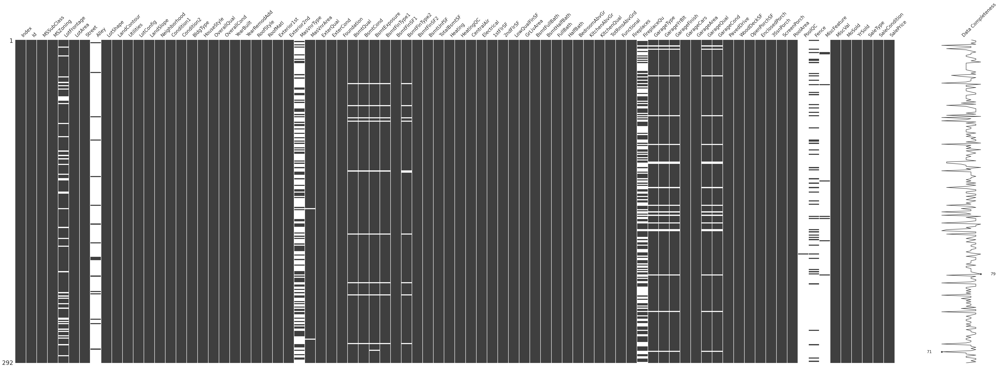

In [72]:
msno.matrix(test,figsize=(60,20),labels=True)
plt.show()

In [73]:
tr_nans=train.columns[train.isna().sum()>0]
tst_nans=test.columns[test.isna().sum()>0]
tst_nans_cols=tst_nans[~tst_nans.isin(tr_nans)]
tst_nans_cols

Index([], dtype='object')

In [74]:
only_in_test=test[test[tst_nans_cols].isna().any(axis=1)]
only_in_test

,Index,Id,MSSubClass,MSZoning,LotFrontage,LotArea,Street,Alley,LotShape,LandContour,Utilities,LotConfig,LandSlope,Neighborhood,Condition1,Condition2,BldgType,HouseStyle,OverallQual,OverallCond,YearBuilt,YearRemodAdd,RoofStyle,RoofMatl,Exterior1st,Exterior2nd,MasVnrType,MasVnrArea,ExterQual,ExterCond,Foundation,BsmtQual,BsmtCond,BsmtExposure,BsmtFinType1,BsmtFinSF1,BsmtFinType2,BsmtFinSF2,BsmtUnfSF,TotalBsmtSF,Heating,HeatingQC,CentralAir,Electrical,1stFlrSF,2ndFlrSF,LowQualFinSF,GrLivArea,BsmtFullBath,BsmtHalfBath,FullBath,HalfBath,BedroomAbvGr,KitchenAbvGr,KitchenQual,TotRmsAbvGrd,Functional,Fireplaces,FireplaceQu,GarageType,GarageYrBlt,GarageFinish,GarageCars,GarageArea,GarageQual,GarageCond,PavedDrive,WoodDeckSF,OpenPorchSF,EnclosedPorch,3SsnPorch,ScreenPorch,PoolArea,PoolQC,Fence,MiscFeature,MiscVal,MoSold,YrSold,SaleType,SaleCondition,SalePrice


Generalno od ovie sho gi nemat vo train setot mnogu malce samples falat, taka da so obichen most_frequent ke pominime. 

In [75]:
tst_tf=data_pipeline.transform(test)